# End-to-end Multi-class Dog Breed Classification

This notebook builids an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The we're using is from [Kaggle's dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/data)

## 3. Evaluation

The [evaluation](www.kaggle.com/competitions/dog-breed-identification/overview/evaluation) is a file with prediction probabiltiities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* These are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000 images in the training set (these images have labels)
* There are around 10,000 images in the test set (these images have no labels, because we want to predict them).

### Get our workspace ready

* Unzip data file
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# !unzip '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip' -d '/content/drive/MyDrive/dog-vision'

In [3]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
import sys

print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)
print('Python version:', sys.version)

# Check for GPU availability
print('GPU', 'available (YES!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF version: 2.19.0
TF Hub version: 0.16.1
Python version: 3.12.11 (main, Jun  4 2025, 08:56:18) [GCC 11.4.0]
GPU available (YES!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's  what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/dog-vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

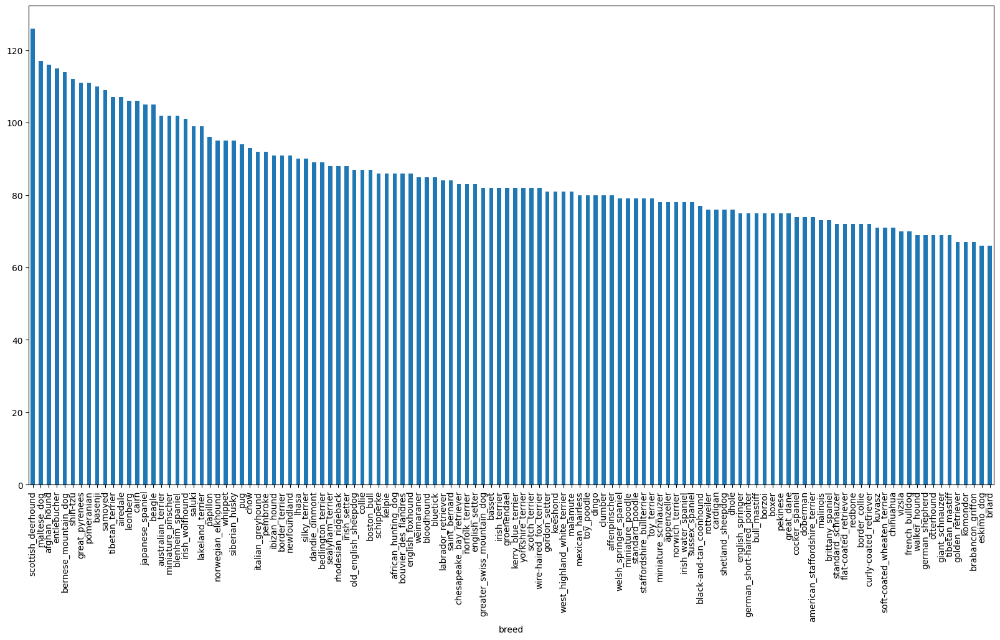

In [6]:
# How many images are there for each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [7]:
# What's the median number of images per class?
labels_csv['breed'].value_counts().median()

82.0

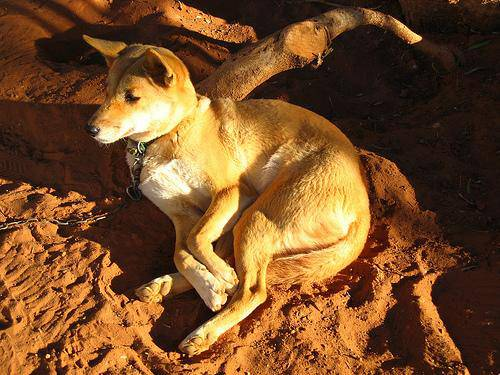

In [8]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting iamges and their labels

Let's get a list of all of our image file pathnames.

In [9]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/dog-vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/dog-vision/train/')) == len(filenames):
  print('Filenames match actual images!')
else:
  print('Filenames do not match actual amount of files')

Filenames match actual images!


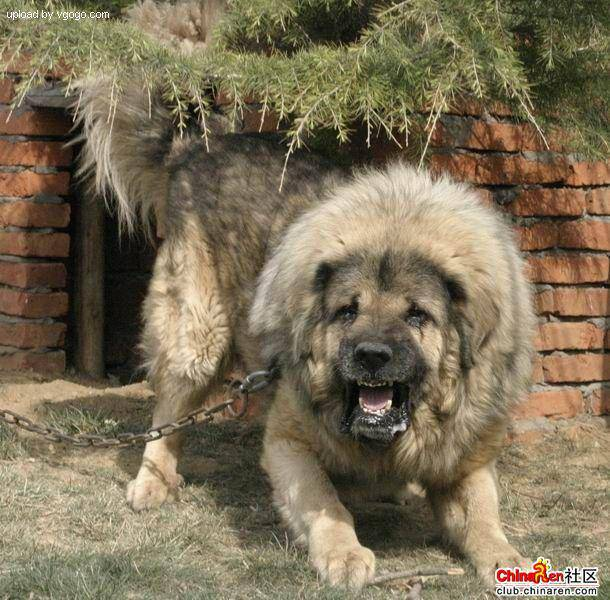

In [11]:
# One more check
Image(filenames[9000])

In [12]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if numbers of labels matches numbers of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
    print('Number of labels doesn\'t match number of filenames')

Number of labels matches number of filenames!


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
# Example: Turning bolean array into integers
print(labels[0]) # orignal label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the samplle label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Scince the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [20]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [21]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [22]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000}

In [23]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [24]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into Tensors)

In [25]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [26]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [27]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable `image`.
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1).
3. Turn our `image` (a .jpg) into Tensors.
5. Resize the `image` to be a shape of (224, 224).
6. Return the modifed `image`.

Before we do, let's see what importing an image looks like.

In [28]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you're to process 10,000+ images in one go, they all might not fit into memory.

So that's why we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be).

In orider to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`



In [29]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label, process the image and
  returns a tuple of (image, label).
  '''
  image = process_image(image_path)
  return image, label


In [30]:
# Demo of the above
process_image(X[42], tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches.

In [31]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [32]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [34]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot pf 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [35]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

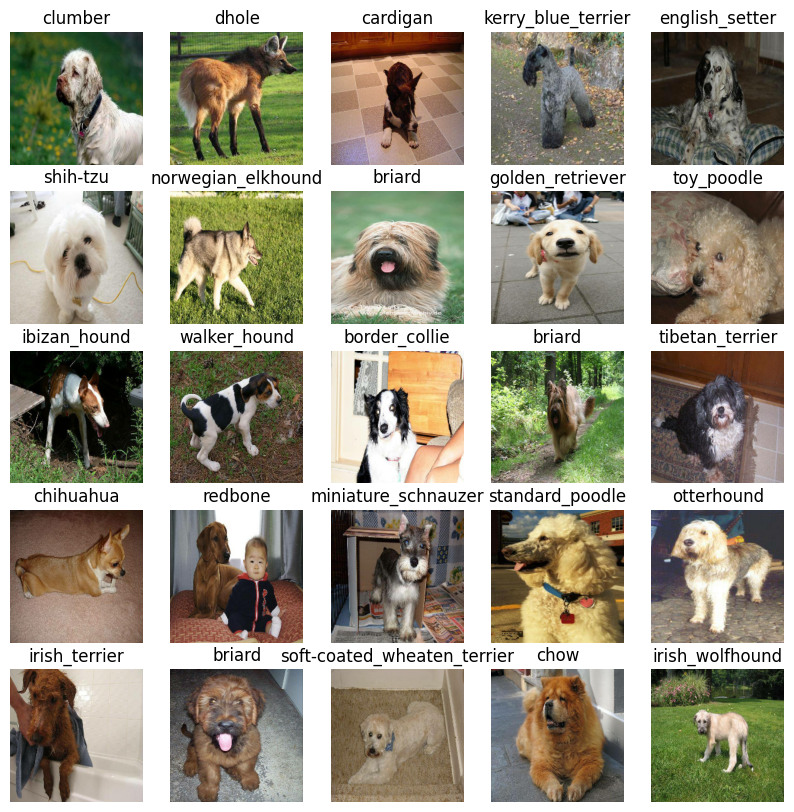

In [36]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

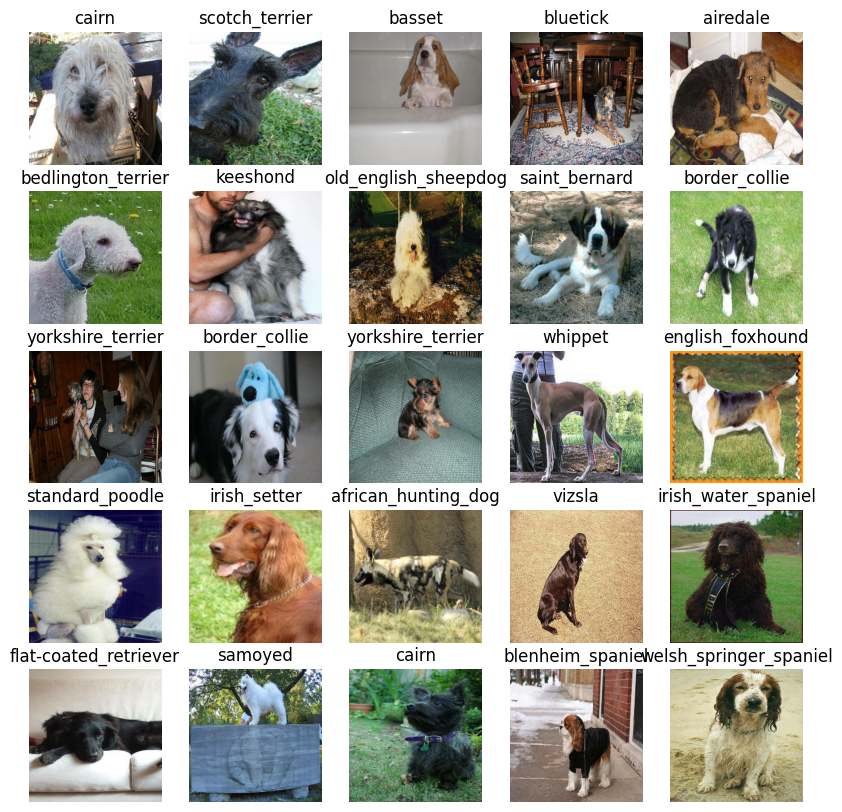

In [37]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Buliding a model

Before we bulid a modedl, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use From [TensorFlow Hub](https://www.kaggle.com/models/google/mobilenet-v2).

In [38]:
import tf_keras as keras

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [39]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our images input, output and model ready to go.
Let's put them together into Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in Keras model as sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Bulids the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found [here](https://www.tensorflow.org/guide/keras).

In [40]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [41]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a s and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tensorboard` magic function (we'll do this after model training).

In [42]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Create a function to bulid a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/dog-vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [44]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [45]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [46]:
# Check to make sure we're still running on a GPU
print('GPU', 'available (YES!)' if tf.config.list_physical_devices('GPU') else 'not available :()')

GPU available (YES!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`num_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [47]:
# Bulid a function to train and return a trained model
def train_model():
  '''
  Train a given model and return the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the modle to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [48]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 194s 8s/step - loss: 4.5681 - accuracy: 0.1013 - val_loss: 3.3369 - val_accuracy: 0.3050
Epoch 2/100
25/25 [==============================] - 5s 213ms/step - loss: 1.6445 - accuracy: 0.6775 - val_loss: 2.1360 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 163ms/step - loss: 0.5667 - accuracy: 0.9375 - val_loss: 1.6729 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 158ms/step - loss: 0.2512 - accuracy: 0.9887 - val_loss: 1.4755 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 3s 135ms/step - loss: 0.1439 - accuracy: 0.9987 - val_loss: 1.4024 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 5s 212ms/step - loss: 0.0986 - accuracy: 1.0000 - val_loss: 1.3535 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [49]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictionsd using a trained model

In [50]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [51]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 111ms/step


array([[5.4494035e-04, 1.4356984e-05, 8.1956998e-04, ..., 3.3256953e-04,
        1.2788834e-04, 7.1247742e-03],
       [5.9617328e-04, 6.5328606e-04, 9.4242143e-03, ..., 4.6754731e-03,
        4.1700937e-03, 1.1351856e-04],
       [2.0314588e-05, 3.1512467e-05, 2.6278189e-04, ..., 1.9798956e-05,
        3.6826597e-05, 7.2466239e-04],
       ...,
       [5.7725929e-06, 2.4386411e-05, 3.5332359e-05, ..., 3.7830145e-05,
        2.3360239e-05, 4.1293340e-05],
       [1.1677467e-03, 1.5064160e-04, 5.2124182e-05, ..., 2.0910565e-04,
        6.9259650e-06, 5.7215998e-03],
       [5.3228682e-04, 5.1876341e-05, 3.3655551e-03, ..., 1.2242580e-02,
        9.8244101e-04, 1.1090313e-04]], dtype=float32)

In [52]:
np.sum(predictions[0])

np.float32(1.0)

In [53]:
# First prediction
index = 42
print(predictions[0])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predict label: {unique_breeds[np.argmax(predictions[index])]}')

[5.44940354e-04 1.43569841e-05 8.19569977e-04 1.00214857e-04
 4.52492095e-04 1.50966618e-04 7.08266944e-02 3.07592069e-04
 1.59973744e-04 7.14541005e-04 1.68479467e-03 8.67341005e-05
 7.65849327e-05 1.35648384e-04 1.07965345e-04 1.48774780e-04
 7.59862523e-05 1.00937501e-01 1.18943917e-05 5.82107023e-05
 2.12346946e-04 5.11825929e-05 1.33660851e-05 8.57313164e-04
 4.23222154e-05 3.69126530e-04 2.73182452e-01 5.05424141e-05
 1.36520842e-03 1.73630819e-04 1.58510171e-04 1.74778805e-03
 6.63718383e-05 2.12364648e-05 7.05411003e-05 1.22596789e-02
 3.46137494e-05 1.43043965e-03 1.25806371e-04 2.90500844e-04
 2.75929691e-04 8.53395977e-05 3.16062942e-05 5.59578068e-04
 4.57876340e-05 1.47051687e-04 9.86268788e-06 1.81220938e-04
 5.29343146e-04 8.65458860e-05 1.07577100e-04 3.08579147e-05
 6.37135599e-05 1.26418294e-04 2.13609499e-04 4.44305224e-05
 3.24800058e-04 5.88529091e-03 4.84283519e-05 1.42085388e-01
 7.62579803e-05 2.36772121e-05 3.23282112e-03 1.32290743e-05
 4.20569675e-04 1.260554

Having the above functionailty is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

> Note: Prediction probabilities are also known as confidence levels.

In [54]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilties into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chihuahua'

Now since our validation is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Creata a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched datasaet of (image, label) Tensors and returns separate arrays
  of images and labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilties to a predicted label.
* Plot the predicted label, it's predicted probabilty, the truth label and the target image on a single plot.


In [57]:
def plot_pred(prediction_probabilities, label, image, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], label[n], image[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending if the prediction right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probabilty of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

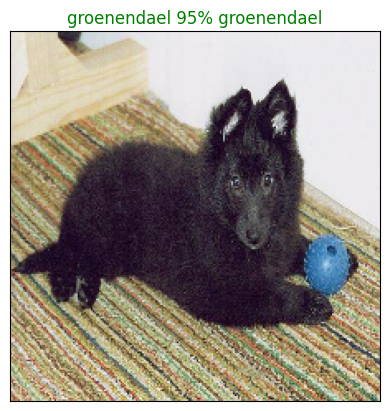

In [58]:
plot_pred(prediction_probabilities=predictions,
          label=val_labels,
          image=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 prediction.

This function will:
* Take an input of the prediction probabilties array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilties values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the top 10 highest prediction confidences along witht the truth labels for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

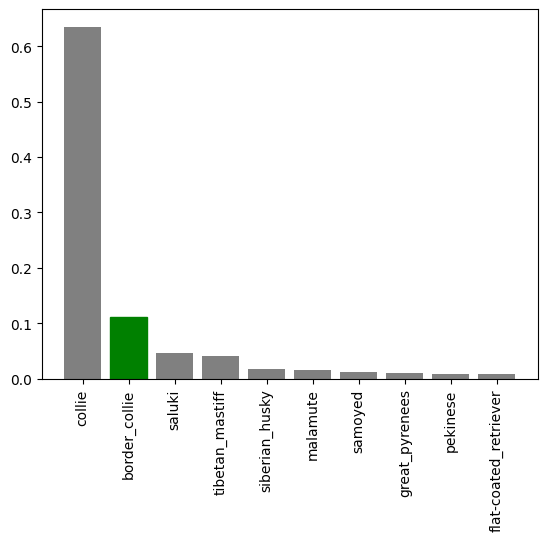

In [60]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [61]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  59,  17,  70, 103,   6,  73, 100, 102,  68])

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

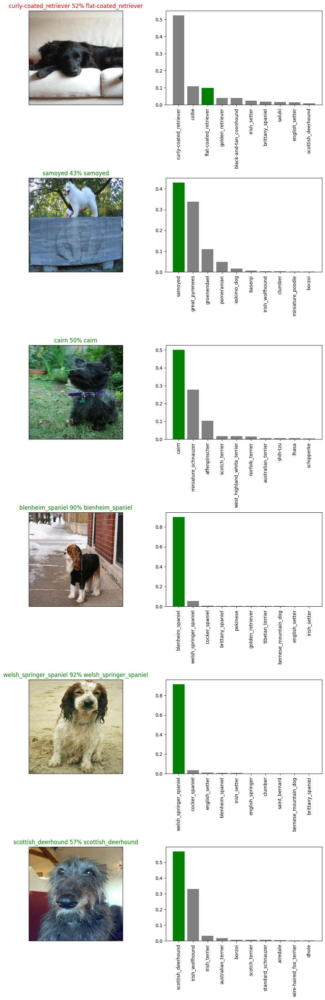

In [62]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 6   # 6 rows = 6 images
num_cols = 1   # كل صف فيه عمودين (صورة + بار)
num_images = num_rows * num_cols

plt.figure(figsize=(10, 5*num_rows))  # العرض أكبر لأن فيه أعمدة جنب بعض
for i in range(num_images):
    # العمود الأول: الصورة
    plt.subplot(num_rows, 2, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              label=val_labels,
              image=val_images,
              n=i+i_multiplier)

    # العمود الثاني: bar chart
    plt.subplot(num_rows, 2, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and Reloading a trained model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in models directory and appends a suffix (string).
  '''
  #Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/dog-vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))

  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to{model_path}...')
  model.save(model_path)
  return model_path

In [64]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading a saved model from: {model_path}...')
  model = keras.models.load_model(model_path,
                                  custom_objects={'KerasLayer':hub.KerasLayer})
  return model


Now we've got a function to save and load models, let's make sure that they work just fine

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to/content/drive/MyDrive/dog-vision/models/20250924-20421758746564-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dog-vision/models/20250924-20421758746564-1000-images-mobilenetv2-Adam.h5'

In [66]:
# Load a trained model
loaded_1000_images_model = load_model('/content/drive/MyDrive/dog-vision/models/20250921-22121758492766-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: /content/drive/MyDrive/dog-vision/models/20250921-22121758492766-1000-images-mobilenetv2-Adam.h5...


In [67]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 160ms/step - loss: 1.2169 - accuracy: 0.7150


[1.2168552875518799, 0.7149999737739563]

In [68]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 146ms/step - loss: 1.2522 - accuracy: 0.6800


[1.2522166967391968, 0.6800000071525574]

## Training a big dog model (On the full data)

In [69]:
len(X), len(y)

(10222, 10222)

In [70]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [71]:
full_data # --> it has (images, labels)

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
# Create model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [73]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor='accuracy',
                                                          patience=3)

> **Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [74]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 54s 156ms/step - loss: 1.3162 - accuracy: 0.6725
Epoch 2/100
320/320 [==============================] - 54s 170ms/step - loss: 0.4008 - accuracy: 0.8824
Epoch 3/100
320/320 [==============================] - 44s 136ms/step - loss: 0.2338 - accuracy: 0.9376
Epoch 4/100
320/320 [==============================] - 57s 178ms/step - loss: 0.1518 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 52s 163ms/step - loss: 0.1036 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 47s 146ms/step - loss: 0.0756 - accuracy: 0.9881
Epoch 7/100
248/320 [======================>.......] - ETA: 9s - loss: 0.0552 - accuracy: 0.9924

KeyboardInterrupt: 

In [ ]:
# Save in the full model
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

In [76]:
# Load in the full model
full_model = load_model('/content/drive/MyDrive/dog-vision/models/20250921-22121758492766-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: /content/drive/MyDrive/dog-vision/models/20250921-22121758492766-1000-images-mobilenetv2-Adam.h5...


## Making predictions on the test dataset

Since our model has been trained on images in the form Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [77]:
# Load test image filenames
test_path = '/content/drive/MyDrive/dog-vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog-vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 '/content/drive/MyDrive/dog-vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 '/content/drive/MyDrive/dog-vision/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 '/content/drive/MyDrive/dog-vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 '/content/drive/MyDrive/dog-vision/test/e18db768bc1a9e7e633940dcadacb231.jpg',
 '/content/drive/MyDrive/dog-vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 '/content/drive/MyDrive/dog-vision/test/e190bfb63cf9a7cf1b3ae2ea654a735b.jpg',
 '/content/drive/MyDrive/dog-vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 '/content/drive/MyDrive/dog-vision/test/e19900119c7d3ce48d4035cd0211be72.jpg',
 '/content/drive/MyDrive/dog-vision/test/e1adb64372b1784c01401cb73bb20807.jpg']

In [78]:
len(test_filenames)

10357

In [79]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [80]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

> **Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [81]:
import os

# مسار مجلد الاختبار
test_path = 'content/drive/MyDrive/dog-vision/test/'

# افحص كل الملفات اللي مفترض موجودة في test_data
missing_files = []
for file in test_filenames:  # test_filenames: قائمة أسماء الملفات اللي model يحاول يقرأها
    if not os.path.exists(os.path.join(test_path, file)):
        missing_files.append(file)

if missing_files:
    print("Missing files:")
    for f in missing_files:
        print(f)
else:
    print("All files are present!")


All files are present!


In [ ]:
# Make predictions on the test batch using the loaded full model
test_predictions = full_model.predict(test_data,
                                      verbose=1)

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/dog-vision/preds_array.csv', test_predictions, delimiter=',')

In [82]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/dog-vision/preds_array.csv', delimiter=',')

In [83]:
test_predictions[:10]

array([[7.61665524e-06, 5.94507993e-12, 6.94134195e-10, ...,
        6.09764184e-10, 2.07512207e-09, 7.72551800e-08],
       [2.53489301e-08, 1.21368168e-06, 2.02233386e-09, ...,
        3.26291388e-06, 5.82279245e-05, 6.29349231e-08],
       [5.91289018e-10, 4.01595181e-11, 1.05893410e-11, ...,
        5.45884093e-09, 2.37496550e-11, 2.73902103e-12],
       ...,
       [2.74906348e-10, 1.34945906e-12, 7.96065935e-10, ...,
        6.97432654e-07, 1.72642500e-09, 3.39530556e-11],
       [4.61180898e-13, 8.19469872e-13, 7.55265154e-13, ...,
        1.80248927e-10, 9.86029400e-12, 4.71972504e-13],
       [3.65055053e-09, 9.94403795e-11, 1.44577167e-12, ...,
        2.82855302e-11, 4.86316132e-15, 1.94235513e-11]])

In [84]:
test_predictions.shape # 10357 images, each one has 120 predictions

(10357, 120)

## Preparing test datasaet predioctions for Kaggle

Looking at the [Kaggle sample submission](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation), we find that it wants our model prediction probaiblity outputs in a DataFrame with an ID and a folumn for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilties) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [86]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [90]:
test_path = '/content/drive/MyDrive/dog-vision/test'

In [94]:
# Append test image ID'sa to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [96]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e181bd9b192ab7b21b851a643c53c817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e17defebd1b8fc39e9c3c10df3c2e3de,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e18a9e69da19fc1a19885d15b7f26e92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e18c30f7ba3680d75ff326ccb71642e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e18db768bc1a9e7e633940dcadacb231,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e181bd9b192ab7b21b851a643c53c817,7.616655e-06,5.945080e-12,6.941342e-10,8.121026e-10,2.944831e-08,2.484297e-09,1.096449e-12,7.293274e-10,1.143872e-11,...,2.902447e-11,6.911976e-09,1.077348e-09,1.484826e-09,5.448018e-07,8.222147e-10,9.402513e-10,6.097642e-10,2.075122e-09,7.725518e-08
1,e17defebd1b8fc39e9c3c10df3c2e3de,2.534893e-08,1.213682e-06,2.022334e-09,6.176739e-03,4.137166e-10,3.199712e-10,5.253723e-10,1.966967e-09,9.548959e-08,...,4.319456e-06,2.019160e-11,2.522776e-07,3.065475e-06,4.791768e-07,7.119708e-11,3.975454e-08,3.262914e-06,5.822792e-05,6.293492e-08
2,e18a9e69da19fc1a19885d15b7f26e92,5.912890e-10,4.015952e-11,1.058934e-11,5.795290e-12,1.319485e-06,1.135987e-09,2.269695e-11,6.868567e-13,1.946106e-12,...,5.139580e-10,7.686370e-10,3.558127e-07,5.719764e-07,7.090963e-10,6.653236e-12,5.763985e-11,5.458841e-09,2.374966e-11,2.739021e-12
3,e18c30f7ba3680d75ff326ccb71642e0,1.187177e-14,4.040933e-07,7.084610e-07,3.780468e-08,6.404851e-05,1.282554e-09,1.956516e-09,4.852767e-10,7.943919e-05,...,1.689334e-08,2.820722e-09,3.297614e-07,3.486727e-05,1.544964e-03,4.118029e-09,1.134575e-10,7.500323e-01,2.005221e-10,8.426603e-12
4,e18db768bc1a9e7e633940dcadacb231,2.160353e-08,9.315174e-07,1.971318e-11,1.349961e-09,9.663813e-10,2.093682e-12,2.432136e-11,1.842363e-10,2.062102e-10,...,7.509720e-07,4.740939e-11,5.670008e-07,2.207018e-07,4.475980e-10,2.083296e-09,2.927569e-10,4.847676e-08,1.390855e-08,6.142289e-08


In [99]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/dog-vision/full_model_submission_1_mobilenetV2.csv', index=False)

## Making predictions on your custom images

To make predictions on custom images; we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilties to predictition labels.
* Compare the predicted labels to the custom images.
